## Modelo de detecção de fraude para dados financeiros

Sobre nosso dataset:

* Step = mapeia uma unidade de tempo no mundo real. Neste caso, 1 passo é 1 hora de tempo. Total de etpas 744 (simulação de 30 dias).
* Type = CASH-IN, CASH-OUT, DEBIT, PAYMENT and TRANSFER.
* amount = valor da transação em moeda local.
* nameOrig = Cliente que iniciou a transação
* oldbalanceOrig = saldo inicial antes da transação
* newbalanceOrig = novo saldo após a transação
* nameDest = cliente que é o destinatário da transação
* oldbalanceDest = destinatário do saldo inicial antes da transação
* newbalanceDest = Novo destinatário do saldo após a transação.
* isFraud = São as transações feitas pelos agentes fraudulentos dentro da simulação. Neste conjunto de dados especifico, o comportamento fraudulento dos agentes visa lucar ao assumir o controle das contas dos clientes e tentar esvaziar os fundos transferidos para outra conta e depois sacando do sistema.
* isFlaggedFraud = O modelo de negócio visa controlar transferências massivas de uma conta para outra e sinaliza tentativas ilegais. Uma tentativa ilegal neste conjunto de dados é uma tentativa de transferir mais de 200.000 em uma única transação.



In [ ]:
# importando as bibliotecas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv("/content/fraud_dataset_example.csv")
df.head()

,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest,isFraud,isFlaggedFraud
0,1,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.0,0.0,0,0
1,1,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.0,0.0,0,0
2,1,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.0,0.0,1,0
3,1,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.0,0.0,1,0
4,1,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.0,0.0,0,0


In [ ]:
df.columns

Index(['step', 'type', 'amount', 'nameOrig', 'oldbalanceOrg', 'newbalanceOrig',
       'nameDest', 'oldbalanceDest', 'newbalanceDest', 'isFraud',
       'isFlaggedFraud'],
      dtype='object')

In [ ]:
df = df[['isFraud','isFlaggedFraud','step', 'type', 'amount', 'nameOrig', 'oldbalanceOrg', 'newbalanceOrig',
       'nameDest', 'oldbalanceDest', 'newbalanceDest', ]]
df.head()

,isFraud,isFlaggedFraud,step,type,amount,nameOrig,oldbalanceOrg,newbalanceOrig,nameDest,oldbalanceDest,newbalanceDest
0,0,0,1,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.0,0.0
1,0,0,1,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.0,0.0
2,1,0,1,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.0,0.0
3,1,0,1,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.0,0.0
4,0,0,1,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.0,0.0


In [ ]:
# Renomeando as colunas
colunas = {
    'isFraud':'fraude',
    'isFlaggedFraud':'possivel_fraude',
    'step':'tempo',
    'type':'tipo',
    'amount':'valor',
    'nameOrig':'cliente1',
    'oldbalanceOrg':'saldo_inicial_c1',
    'newbalanceOrig':'novo_saldo_c1',
    'nameDest':'cliente2',
    'oldbalanceDest':'saldo_inicial_c2',
    'newbalanceDest':'novo_saldo_c2'
}

In [ ]:
df = df.rename(columns=colunas)
df.head()

,fraude,possivel_fraude,tempo,tipo,valor,cliente1,saldo_inicial_c1,novo_saldo_c1,cliente2,saldo_inicial_c2,novo_saldo_c2
0,0,0,1,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.0,0.0
1,0,0,1,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.0,0.0
2,1,0,1,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.0,0.0
3,1,0,1,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.0,0.0
4,0,0,1,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.0,0.0


In [ ]:
df.describe()

,fraude,possivel_fraude,tempo,valor,saldo_inicial_c1,novo_saldo_c1,saldo_inicial_c2,novo_saldo_c2
count,101613.000000,101613.0,101613.000000,1.016130e+05,1.016130e+05,1.016130e+05,1.016130e+05,1.016130e+05
mean,0.001142,0.0,8.523457,1.740901e+05,9.071753e+05,9.234992e+05,8.810428e+05,1.183998e+06
std,0.033768,0.0,1.820681,3.450199e+05,2.829575e+06,2.867319e+06,2.399949e+06,2.797761e+06
min,0.000000,0.0,1.000000,3.200000e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000,0.0,8.000000,1.001659e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,0.000000,0.0,9.000000,5.338541e+04,2.019047e+04,0.000000e+00,2.105800e+04,5.178343e+04
75%,0.000000,0.0,10.000000,2.124984e+05,1.947150e+05,2.192178e+05,5.919217e+05,1.063122e+06
max,1.000000,0.0,10.000000,1.000000e+07,3.893942e+07,3.894623e+07,3.400874e+07,3.894623e+07


In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
fraude,101613.0,1.141586e-03,3.376824e-02,0.00,0.00,0.00,0.00,1.00
possivel_fraude,101613.0,0.000000e+00,0.000000e+00,0.00,0.00,0.00,0.00,0.00
tempo,101613.0,8.523457e+00,1.820681e+00,1.00,8.00,9.00,10.00,10.00
valor,101613.0,1.740901e+05,3.450199e+05,0.32,10016.59,53385.41,212498.40,10000000.00
saldo_inicial_c1,101613.0,9.071753e+05,2.829575e+06,0.00,0.00,20190.47,194715.00,38939424.03
novo_saldo_c1,101613.0,9.234992e+05,2.867319e+06,0.00,0.00,0.00,219217.76,38946233.02
saldo_inicial_c2,101613.0,8.810428e+05,2.399949e+06,0.00,0.00,21058.00,591921.70,34008736.98
novo_saldo_c2,101613.0,1.183998e+06,2.797761e+06,0.00,0.00,51783.43,1063121.64,38946233.02


### Verificando valores nulos

In [ ]:
df.isnull().sum()

,0
fraude,0
possivel_fraude,0
tempo,0
tipo,0
valor,0
cliente1,0
saldo_inicial_c1,0
novo_saldo_c1,0
cliente2,0
saldo_inicial_c2,0


### Encoding

In [ ]:
# Instalando o pandas profiling
!pip install ydata-profiling

In [ ]:
from ydata_profiling import ProfileReport

ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df_dumm = pd.get_dummies(pd.Series(list(df['tipo'])),dtype=float)
df_dumm.head()

,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,1.0
3,0.0,1.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0


In [ ]:
df_dumm_conv = ['CASH_IN', 'CASH_OUT', 'DEBIT', 'PAYMENT', 'TRANSFER']
df_dumm[df_dumm_conv] = df_dumm[df_dumm_conv].astype(float)
df_dumm.head()

,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,1.0
3,0.0,1.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0


In [ ]:
df = pd.merge(df,df_dumm,left_index=True,right_index=True)
df.head()

,fraude,possivel_fraude,tempo,tipo,valor,cliente1,saldo_inicial_c1,novo_saldo_c1,cliente2,saldo_inicial_c2,novo_saldo_c2,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
0,0,0,1,PAYMENT,9839.64,C1231006815,170136.0,160296.36,M1979787155,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0,0,1,PAYMENT,1864.28,C1666544295,21249.0,19384.72,M2044282225,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,0,1,TRANSFER,181.00,C1305486145,181.0,0.00,C553264065,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1,0,1,CASH_OUT,181.00,C840083671,181.0,0.00,C38997010,21182.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0,0,1,PAYMENT,11668.14,C2048537720,41554.0,29885.86,M1230701703,0.0,0.0,0.0,0.0,0.0,1.0,0.0


Tive que fazer essa manobra pra poder juntar dois dataset e converter os valores das colunas CASH_IN, CASH_OUT, DEBIT, PAYMENT e TRANSFER.

In [ ]:
df = df.drop(['cliente1', 'cliente2', 'possivel_fraude'], axis=1)
df.head()

,fraude,tempo,tipo,valor,saldo_inicial_c1,novo_saldo_c1,saldo_inicial_c2,novo_saldo_c2,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
0,0,1,PAYMENT,9839.64,170136.0,160296.36,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0,1,PAYMENT,1864.28,21249.0,19384.72,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,1,TRANSFER,181.00,181.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1,1,CASH_OUT,181.00,181.0,0.00,21182.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0,1,PAYMENT,11668.14,41554.0,29885.86,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
df=df.drop(['tipo'], axis=1)
df.head()

,fraude,tempo,valor,saldo_inicial_c1,novo_saldo_c1,saldo_inicial_c2,novo_saldo_c2,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
0,0,1,9839.64,170136.0,160296.36,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0,1,1864.28,21249.0,19384.72,0.0,0.0,0.0,0.0,0.0,1.0,0.0
2,1,1,181.00,181.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1,1,181.00,181.0,0.00,21182.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0,1,11668.14,41554.0,29885.86,0.0,0.0,0.0,0.0,0.0,1.0,0.0


### Regressão Logística

In [ ]:
x = df.drop('fraude', axis=1)
y = df['fraude']

In [ ]:
from sklearn.model_selection import train_test_split

SEED = 42

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=SEED)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

lr = LogisticRegression(max_iter = 1000, random_state=SEED)
lr.fit(x_train, y_train)
y_pred = lr.predict(x_test)

print('Acurácia: ', metrics.accuracy_score(y_test, y_pred))
print('Precisão: ', metrics.precision_score(y_test, y_pred))
print('Recall: ', metrics.recall_score(y_test, y_pred))
print('F1: ', metrics.f1_score(y_test, y_pred))

Acurácia:  0.9990552668871044
Precisão:  0.3333333333333333
Recall:  0.043478260869565216
F1:  0.07692307692307693


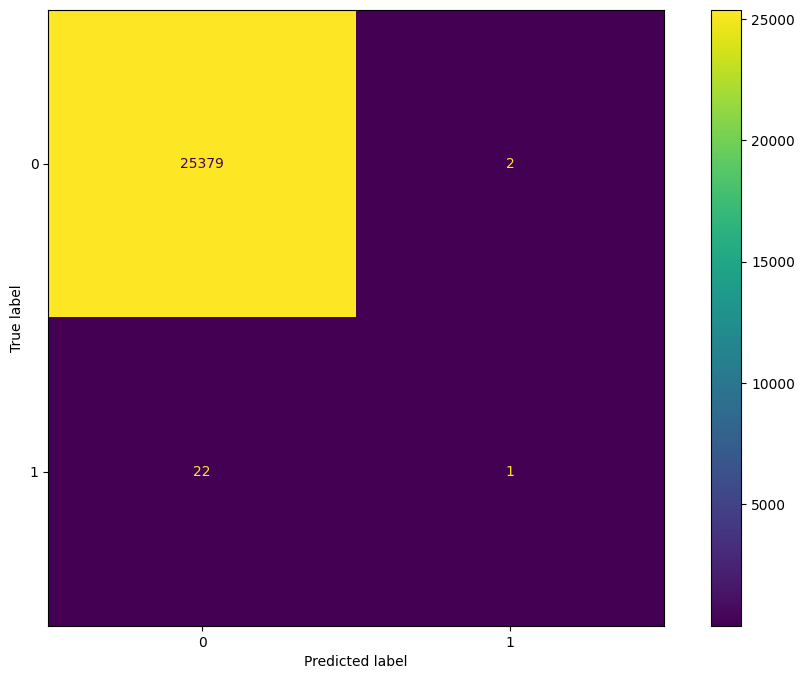

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.datasets import make_classification
from sklearn.metrics import ConfusionMatrixDisplay
%matplotlib inline

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

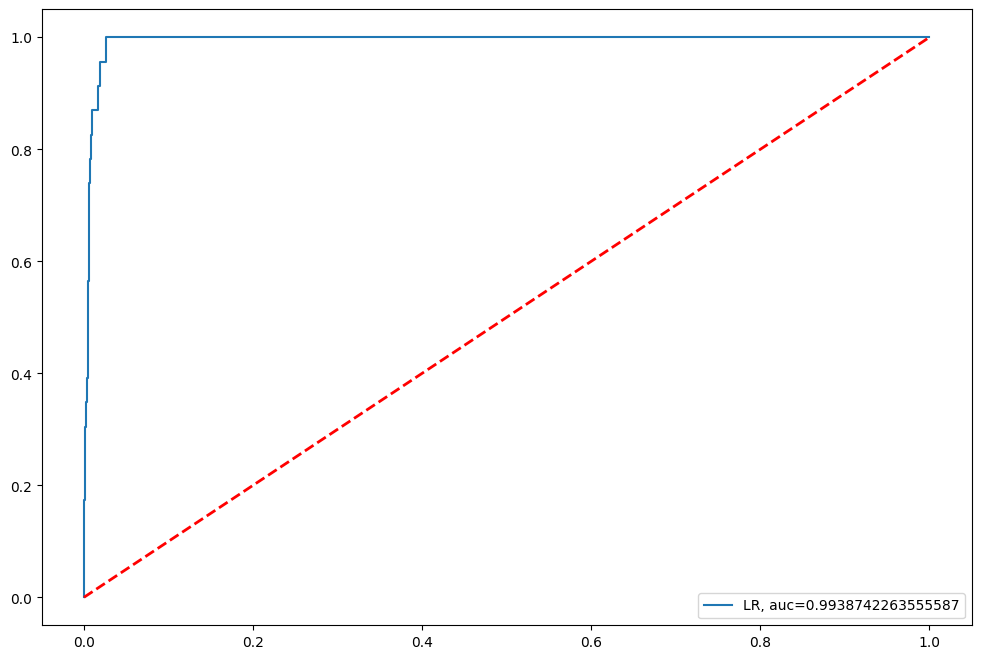

In [ ]:
y_pred_proba = lr.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)

plt.rcParams['figure.figsize'] = (12,8)
plt.plot(fpr, tpr, label="LR, auc="+str(auc))
plt.plot([0,1], [0,1], color = 'red', lw=2, linestyle='--')
plt.legend(loc=4)

Aqui enxergamos que nossas classes estão desbalanceadas, neste caso precisamos balancear as classes para não deixar o modelo tendencioso.

* UNDERSAMPLING = reduzir dados de não fraude para 116 (errado)
* OVERSAMPLING = copiar os dados da classe minoritária até chegar no valor da classe majoritária,mas tem problemas por exemplo quando aplicamos a técnica teoricamente colocamos valores sinteticos para treinar nosso modelo, ou seja, não são valores reais.

SMOTE = Algoritmo KNN (aproximação dos vizinhos)


### Balanceamento de dados

In [ ]:
!pip install -U imbalanced-learn

In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=SEED)

In [ ]:
x_resampled, y_resampled = smote.fit_resample(x, y)

In [ ]:
df_balanced = pd.concat([x_resampled, y_resampled], axis=1)
df_balanced.head()

,tempo,valor,saldo_inicial_c1,novo_saldo_c1,saldo_inicial_c2,novo_saldo_c2,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER,fraude
0,1,9839.64,170136.0,160296.36,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
1,1,1864.28,21249.0,19384.72,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
2,1,181.00,181.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1
3,1,181.00,181.0,0.00,21182.0,0.0,0.0,1.0,0.0,0.0,0.0,1
4,1,11668.14,41554.0,29885.86,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0


In [ ]:
df_balanced.groupby('fraude').count()

,tempo,valor,saldo_inicial_c1,novo_saldo_c1,saldo_inicial_c2,novo_saldo_c2,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER
fraude,,,,,,,,,,,
0,101497,101497,101497,101497,101497,101497,101497,101497,101497,101497,101497
1,101497,101497,101497,101497,101497,101497,101497,101497,101497,101497,101497


In [ ]:
df_balanced.describe()

,tempo,valor,saldo_inicial_c1,novo_saldo_c1,saldo_inicial_c2,novo_saldo_c2,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER,fraude
count,202994.000000,2.029940e+05,2.029940e+05,2.029940e+05,2.029940e+05,2.029940e+05,202994.000000,202994.000000,202994.000000,202994.000000,202994.000000,202994.000000
mean,6.912475,3.199864e+05,6.904858e+05,4.719341e+05,5.178638e+05,8.657305e+05,0.101185,0.394236,0.004985,0.197356,0.302238,0.500000
std,2.645246,9.302225e+05,2.230984e+06,2.081934e+06,1.834739e+06,2.329333e+06,0.301575,0.467993,0.070431,0.398004,0.437143,0.500001
min,1.000000,3.200000e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.000000,1.322903e+04,5.480205e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,8.000000,4.729562e+04,2.854583e+04,0.000000e+00,4.298397e+02,1.035667e+04,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000
75%,9.000000,2.424080e+05,2.419973e+05,3.416070e+03,1.395740e+05,5.276146e+05,0.000000,1.000000,0.000000,0.000000,0.942703,1.000000
max,10.000000,1.000000e+07,3.893942e+07,3.894623e+07,3.400874e+07,3.894623e+07,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
df_balanced

,tempo,valor,saldo_inicial_c1,novo_saldo_c1,saldo_inicial_c2,novo_saldo_c2,CASH_IN,CASH_OUT,DEBIT,PAYMENT,TRANSFER,fraude
0,1,9839.640000,170136.000000,160296.36,0.000000,0.000000,0.0,0.00000,0.0,1.0,0.00000,0
1,1,1864.280000,21249.000000,19384.72,0.000000,0.000000,0.0,0.00000,0.0,1.0,0.00000,0
2,1,181.000000,181.000000,0.00,0.000000,0.000000,0.0,0.00000,0.0,0.0,1.00000,1
3,1,181.000000,181.000000,0.00,21182.000000,0.000000,0.0,1.00000,0.0,0.0,0.00000,1
4,1,11668.140000,41554.000000,29885.86,0.000000,0.000000,0.0,0.00000,0.0,1.0,0.00000,0
...,...,...,...,...,...,...,...,...,...,...,...,...
202989,5,17608.962863,17608.962863,0.00,0.000000,0.000000,0.0,0.00000,0.0,0.0,1.00000,1
202990,7,12116.291013,12116.291013,0.00,0.000000,0.000000,0.0,0.00000,0.0,0.0,1.00000,1
202991,1,231612.880715,231612.880715,0.00,1945.589357,9370.603471,0.0,0.19269,0.0,0.0,0.80731,1
202992,9,547325.144758,547325.144758,0.00,0.000000,0.000000,0.0,0.00000,0.0,0.0,1.00000,1


### Novo teste de Regressão Logistica

In [ ]:
x = df_balanced.drop('fraude', axis=1)
y = df_balanced['fraude']

In [ ]:
from sklearn.model_selection import train_test_split

SEED = 42

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state=SEED)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

lr = LogisticRegression(solver='lbfgs',class_weight='balanced', max_iter=10000)

lr.fit(x_train, y_train)
y_pred=lr.predict(x_test)

print("Acurácia:", metrics.accuracy_score(y_test, y_pred))
print("Precisão:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1:", metrics.f1_score(y_test, y_pred))

Acurácia: 0.9656544956550868
Precisão: 0.9626681306615427
Recall: 0.9687845303867403
F1: 0.9657166460140438


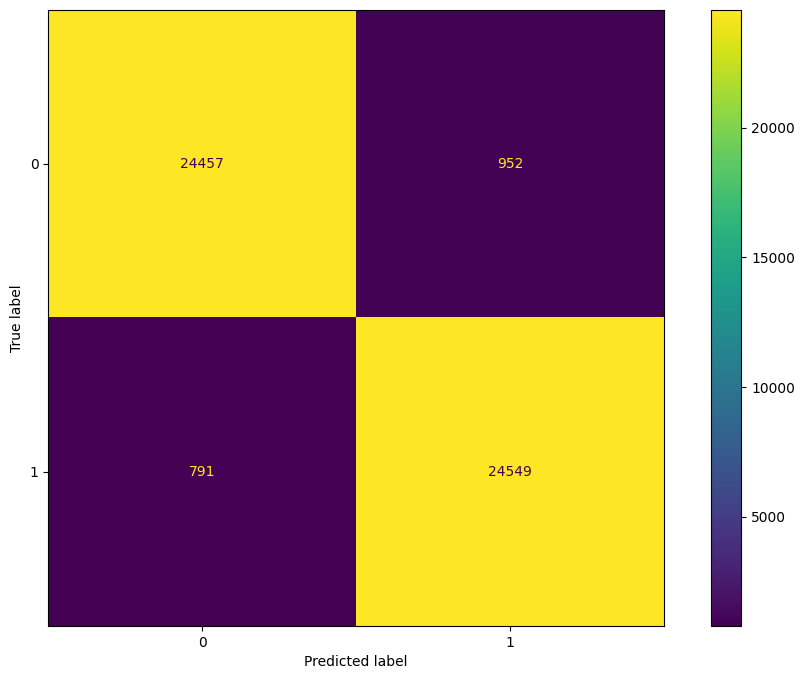

In [ ]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

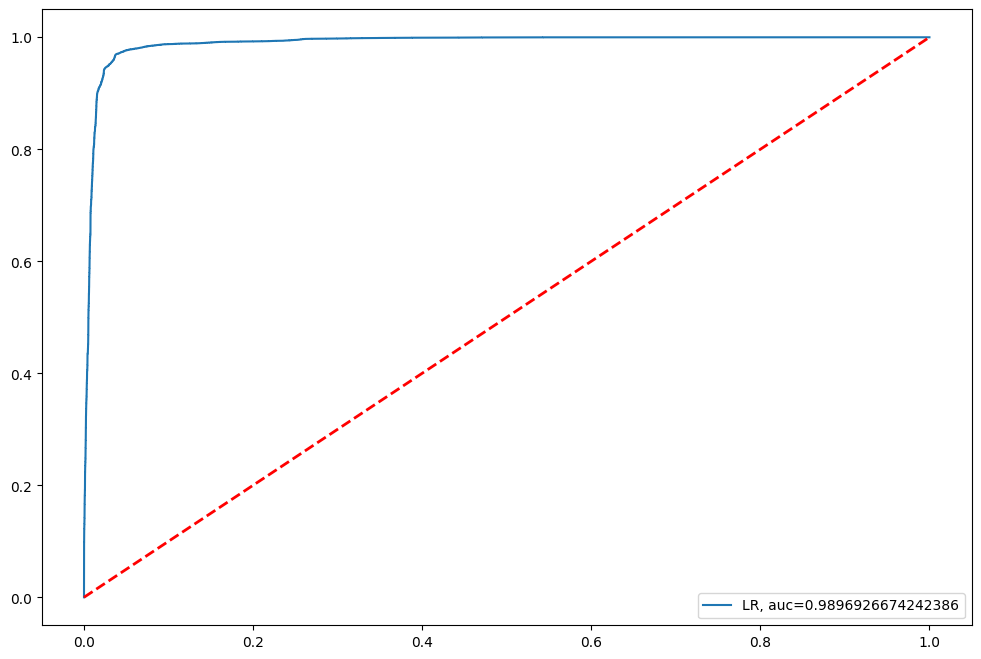

In [ ]:
y_pred_proba = lr.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)

plt.rcParams['figure.figsize'] = (12,8)
plt.plot(fpr, tpr, label="LR, auc="+str(auc))
plt.plot([0,1], [0,1], color = 'red', lw=2, linestyle='--')
plt.legend(loc=4)

### Formulando as hipóteses

In [ ]:
ProfileReport(df_balanced)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

** Inserir as hipóteses**
- pegando como paramentro a coluna fraude, a correlação mais alta está com CASH_IN, CASHOUT, PAYMENT, tempo e TRANSFER
- As colunas novo saldoc1 e c2 tem baixa correlação e também saldo inicial c1 e c2, logo esses valores não são importantes para a fraude ocorrer.

### Árvore de decisão

In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier(max_depth=5, random_state=SEED)

In [ ]:
model = dt.fit(x_train, y_train)
y_pred = dt.predict(x_test)

print("Acurácia:", metrics.accuracy_score(y_test, y_pred))
print("Precisão:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1:", metrics.f1_score(y_test, y_pred))

Acurácia: 0.9595065912628821
Precisão: 0.9379678742053192
Recall: 0.9839779005524862
F1: 0.9604221635883905


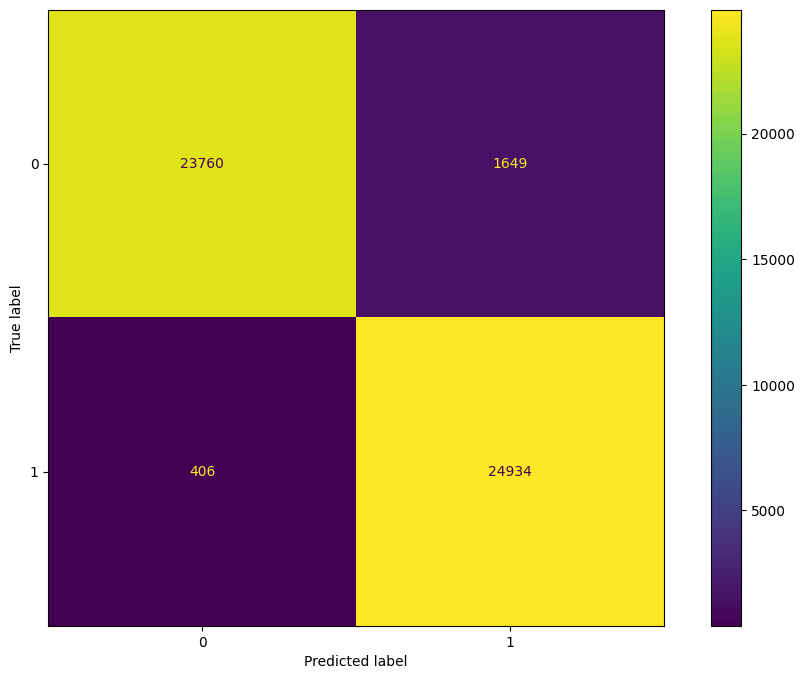

In [ ]:
cm_decision = confusion_matrix(y_test, y_pred)
disp_decision = ConfusionMatrixDisplay(confusion_matrix=cm_decision)
disp_decision.plot()

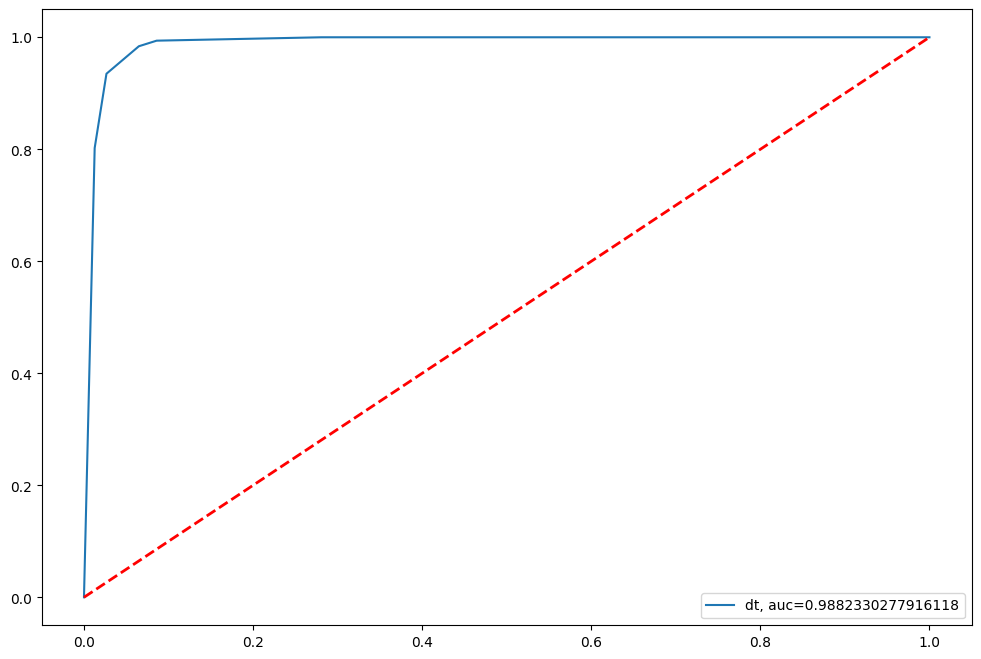

In [ ]:
y_pred_proba = dt.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)

plt.rcParams['figure.figsize'] = (12,8)
plt.plot(fpr, tpr, label="dt, auc="+str(auc))
plt.plot([0,1], [0,1], color = 'red', lw=2, linestyle='--')
plt.legend(loc=4)

### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(max_depth=5, random_state=SEED, n_estimators=120)

In [ ]:
model = rf.fit(x_train, y_train)
y_pred = rf.predict(x_test)

print("Acurácia:", metrics.accuracy_score(y_test, y_pred))
print("Precisão:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1:", metrics.f1_score(y_test, y_pred))

Acurácia: 0.9730240989970246
Precisão: 0.9778335924729896
Recall: 0.9679163378058405
F1: 0.9728496916089879


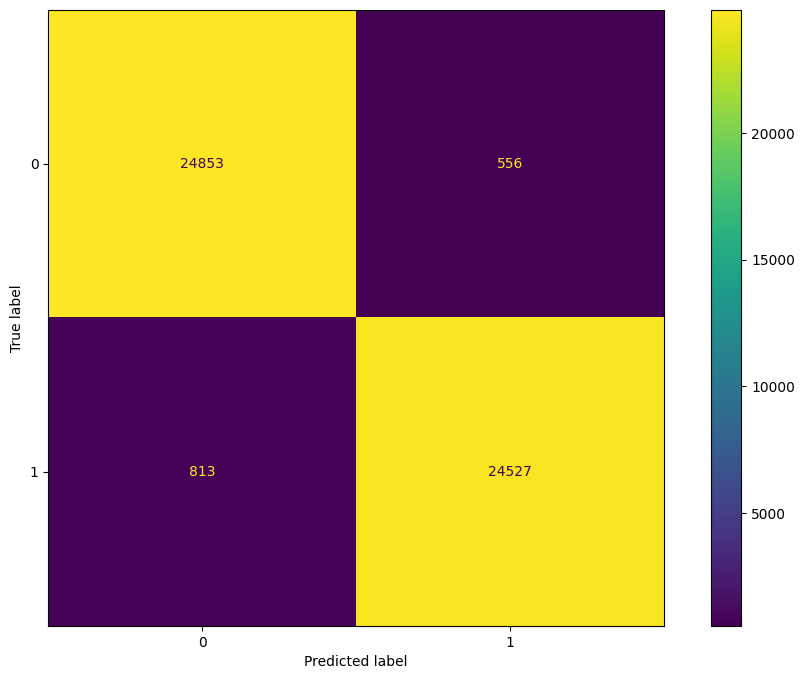

In [ ]:
cm_random = confusion_matrix(y_test, y_pred)
disp_decision = ConfusionMatrixDisplay(confusion_matrix=cm_random)
disp_decision.plot()

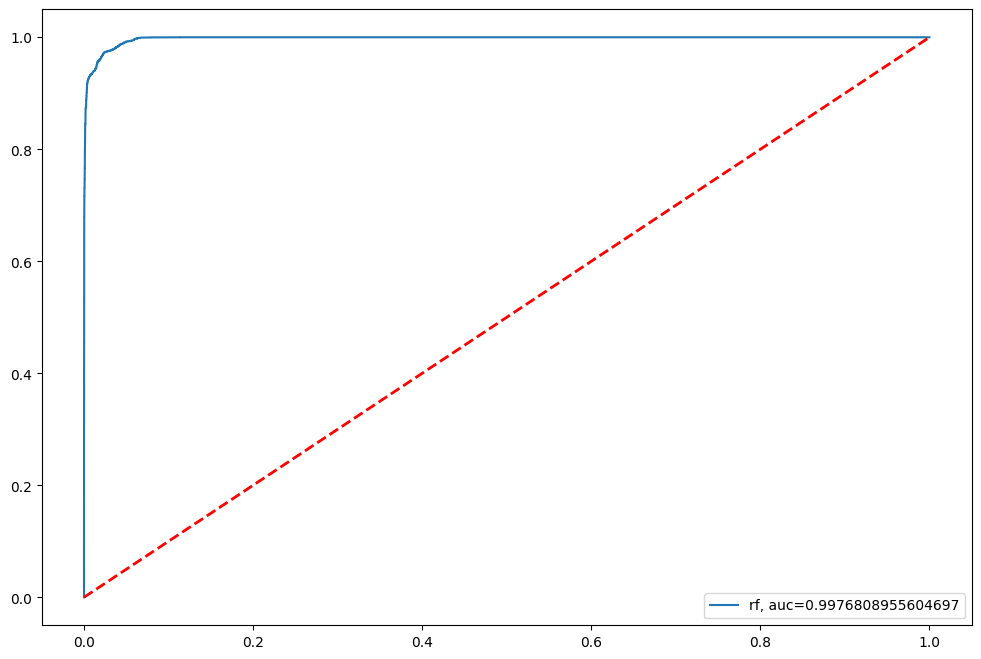

In [ ]:
y_pred_proba = rf.predict_proba(x_test)[::,1]
fpr, tpr, _ = metrics.roc_curve(y_test, y_pred_proba)
auc = metrics.roc_auc_score(y_test, y_pred_proba)

plt.rcParams['figure.figsize'] = (12,8)
plt.plot(fpr, tpr, label="rf, auc="+str(auc))
plt.plot([0,1], [0,1], color = 'red', lw=2, linestyle='--')
plt.legend(loc=4)

### Análise de Métricas

In [ ]:
classifiers = [
    LogisticRegression(max_iter=1000, random_state=SEED),
    DecisionTreeClassifier(max_depth=5, random_state=SEED),
    RandomForestClassifier(max_depth=5, random_state=SEED)]

LogisticRegression
****Results****
Accuracy: 0.9656544956550868
Precision: 0.9626681306615427
Recall: 0.9687845303867403
F1: 0.9657166460140438
DecisionTreeClassifier
****Results****
Accuracy: 0.9595065912628821
Precision: 0.9379678742053192
Recall: 0.9839779005524862
F1: 0.9604221635883905
RandomForestClassifier
****Results****
Accuracy: 0.9717629904037518
Precision: 0.9777768895639314
Recall: 0.9653906866614049
F1: 0.9715443118409818


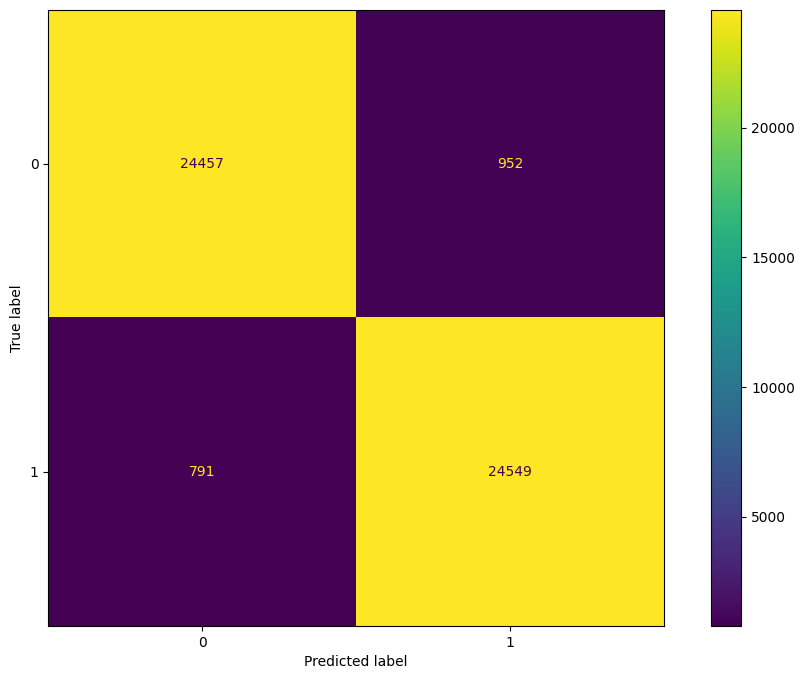

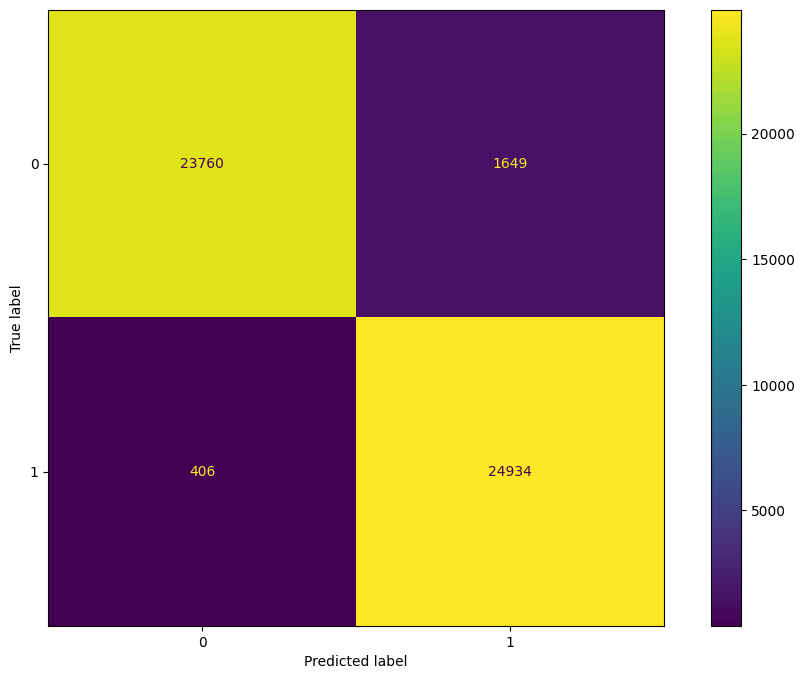

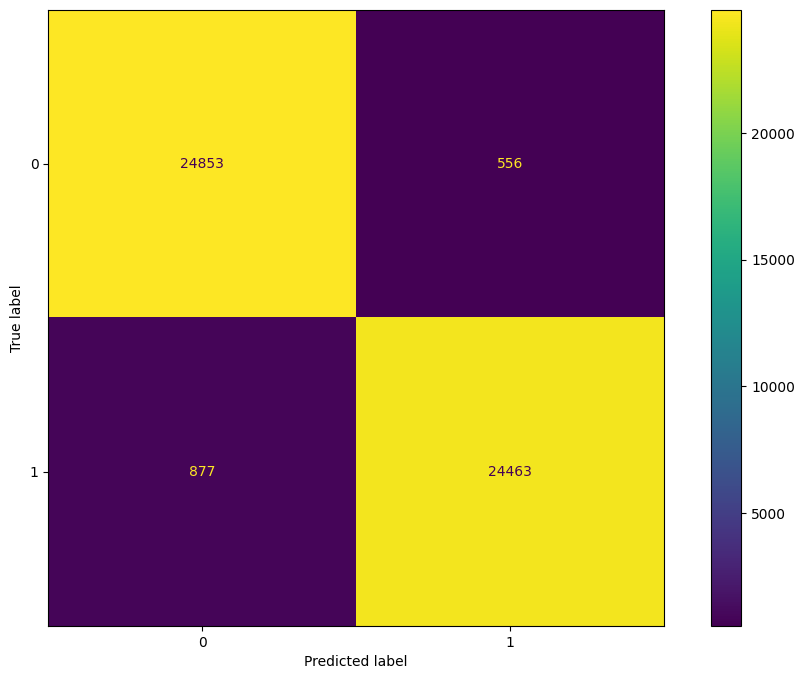

In [ ]:
for clf in classifiers:
  clf.fit(x_train, y_train)
  name=clf.__class__.__name__
  print("="*30)
  print(name)
  print('****Results****')
  y_pred = clf.predict(x_test)
  print("Accuracy:", metrics.accuracy_score(y_test, y_pred))
  print("Precision:", metrics.precision_score(y_test, y_pred))
  print("Recall:", metrics.recall_score(y_test, y_pred))
  print("F1:", metrics.f1_score(y_test, y_pred))
  print("="*30)

  cm = confusion_matrix(y_test, y_pred)
  disp = ConfusionMatrixDisplay(confusion_matrix=cm)
  disp.plot()

### Melhorando o modelo Random Forest

In [ ]:
n_estimators = np.arange(20,200, step=20)
criterion = ["gini", "entropy"]
max_features = ["auto", "sqrt", "log2"]
max_depth = list(np.arange(2, 10, step=1))
min_samples_split = list(np.arange(2, 10, step=1))
min_samples_leaf = [1,2,4]
bootstrap = [True, False]

In [ ]:
param_grid = {
    'n_estimators': n_estimators,
    'criterion': criterion,
    'max_features': max_features,
    'max_depth': max_depth,
    'min_samples_split': min_samples_split,
    'min_samples_leaf': min_samples_leaf,
    'bootstrap': bootstrap
}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

SEED = 70

rforest = RandomForestClassifier(random_state=SEED)

In [ ]:
random_cv = RandomizedSearchCV(
    rforest, param_grid, n_iter=5, cv=3, scoring="recall", n_jobs=-1, random_state=SEED
)

In [ ]:
%%time
rcv = random_cv.fit(x, y)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:540: FitFailedWarning: 
3 fits failed out of a total of 15.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1466, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_pa

CPU times: user 35.7 s, sys: 558 ms, total: 36.3 s
Wall time: 3min 40s


In [ ]:
pd.DataFrame(rcv.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_criterion,param_bootstrap,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,26.732306,1.677255,0.470360,0.182297,120,5,4,sqrt,4,gini,False,"{'n_estimators': 120, 'min_samples_split': 5, ...",0.965713,0.970946,0.949781,0.962147,0.009001,3
1,32.857628,2.005260,0.470669,0.054154,100,6,2,sqrt,9,gini,False,"{'n_estimators': 100, 'min_samples_split': 6, ...",0.989684,0.998877,0.990335,0.992965,0.004189,1
2,38.821740,1.142195,0.521675,0.033232,160,7,4,sqrt,5,gini,False,"{'n_estimators': 160, 'min_samples_split': 7, ...",0.970856,0.995300,0.964028,0.976728,0.013425,2
3,17.845621,1.610444,0.323456,0.126470,160,8,1,sqrt,2,entropy,True,"{'n_estimators': 160, 'min_samples_split': 8, ...",0.914223,0.931398,0.928913,0.924845,0.007579,4
4,0.018142,0.004233,0.000000,0.000000,160,8,1,auto,9,gini,False,"{'n_estimators': 160, 'min_samples_split': 8, ...",NaN,NaN,NaN,NaN,NaN,5


In [ ]:
rcv.best_params_

{'n_estimators': 100,
 'min_samples_split': 6,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 9,
 'criterion': 'gini',
 'bootstrap': False}

### Resultados Finais

In [ ]:
rfn = RandomForestClassifier(**rcv.best_params_, random_state=SEED)

model = rfn.fit(x_train, y_train)
y_pred = rfn.predict(x_test)

In [ ]:
print("Acurácia:", metrics.accuracy_score(y_test, y_pred))
print("Precisão:", metrics.precision_score(y_test, y_pred))
print("Recall:", metrics.recall_score(y_test, y_pred))
print("F1:", metrics.f1_score(y_test, y_pred))

Acurácia: 0.9917436796784173
Precisão: 0.991170325988411
Recall: 0.9923046566692976
F1: 0.9917371669723323


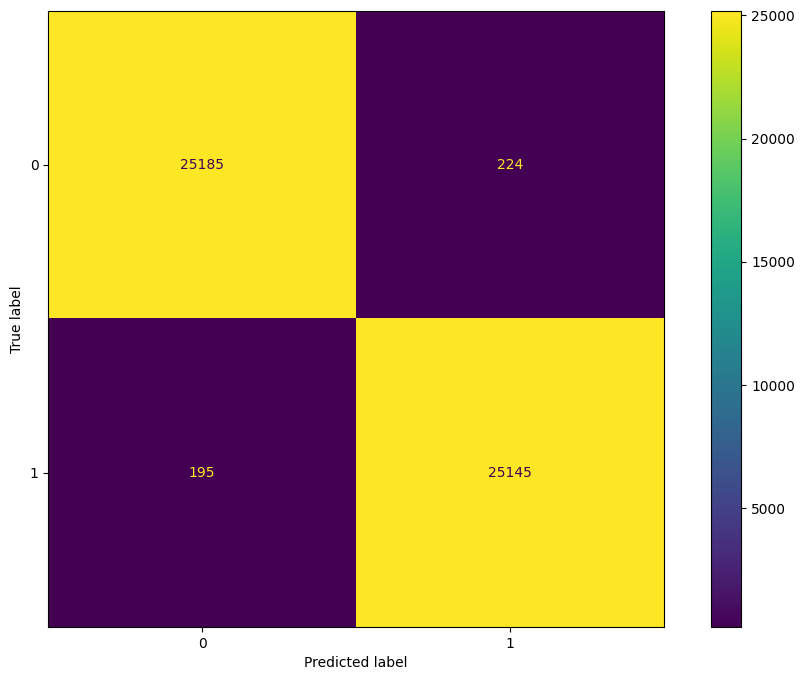

In [ ]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()